# Import libraries

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

import joblib

import time
import os

# Import Data

In [3]:

#95_file='/content/v5_20230407_091351_95m.csv'
#310_file='/content/v5_20230408_082538_310m.csv'
#file_206='/content/v5_20230409_090939_206m.csv'
#file_290='/content/v5_20240127_090226_290m.csv'
#file_135='/content/v5_20240203_091405_135m.csv'
#file_57='/content/v5_20240204_150730_57m.csv'
file_166='/content/v5_20240204_094535_166m.csv'
#df_95=pd.read_csv(95_file)
#df_310=pd.read_csv(310_file)
#df_206=pd.read_csv(file_206)
#df_290=pd.read_csv(file_290)
#df_135=pd.read_csv(file_135)
#df_57=pd.read_csv(file_57)
df_166=pd.read_csv(file_166)



In [4]:
df_166

,Timestamp,accelX(g),accelY(g),accelZ(g),accelUserX(g),accelUserY(g),accelUserZ(g),gyroX(rad/s),gyroY(rad/s),gyroZ(rad/s),...,ActivityType,ActivityConfidence,Pressure(kilopascals),RelativeAltitude(meters),magX(µT),magY(µT),magZ(µT),calMagX(µT),calMagY(µT),calMagZ(µT)
0,04-Feb-2024 09:45:35.856,0.1922,-0.3479,-0.9826,0.0070,0.1008,0.0347,-0.2991,0.1544,-0.0899,...,Unknown,High,76.1190,0.0000,453.5881,-134.0068,-256.9979,-9.0679,-27.6036,-45.7127
1,04-Feb-2024 09:45:35.933,0.1124,-0.3443,-0.6441,-0.0636,0.0793,0.2446,0.5334,0.1147,0.0571,...,Unknown,High,76.1190,0.0000,453.9400,-135.6777,-255.1708,-9.1050,-28.5956,-44.6065
2,04-Feb-2024 09:45:36.033,0.0908,-0.3970,-0.6866,-0.0714,0.0364,0.2205,0.2636,-0.0981,0.1425,...,Unknown,High,76.1190,0.0000,454.2118,-134.6189,-255.8427,-8.6285,-27.0907,-45.4847
3,04-Feb-2024 09:45:36.134,0.2089,-0.3202,-0.8407,0.0212,0.0493,0.0303,-0.7097,-0.0324,-0.1591,...,Unknown,High,76.1190,0.0000,455.1006,-131.0334,-258.1115,-7.9854,-24.0043,-47.4228
4,04-Feb-2024 09:45:36.234,0.1273,-0.3288,-0.7545,-0.0642,0.0174,0.1596,-0.1509,-0.2361,-0.0341,...,Unknown,High,76.1190,0.0000,454.7579,-129.3629,-257.8744,-8.1491,-21.6835,-47.6756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99573,04-Feb-2024 12:31:51.324,0.1062,-0.3922,-0.8978,0.0277,-0.0178,0.0298,0.0982,0.1840,-0.0010,...,Walking,High,86.6749,-1050.2614,476.1750,-93.7697,-259.9379,15.0748,21.6238,-55.3556
99574,04-Feb-2024 12:31:51.424,0.1005,-0.3699,-0.9621,0.0010,0.0090,-0.0396,0.0164,0.1958,0.0745,...,Walking,High,86.6744,-1050.2139,477.7822,-93.4013,-260.4801,16.5264,22.0226,-55.5426
99575,04-Feb-2024 12:31:51.524,0.1338,-0.4070,-0.9338,0.0017,-0.0075,-0.0181,0.0923,0.1252,-0.0051,...,Walking,High,86.6744,-1050.2139,478.6812,-93.5132,-260.7642,17.7100,21.9918,-55.9416
99576,04-Feb-2024 12:31:51.624,0.1456,-0.4298,-0.8418,0.0095,-0.0192,0.0514,0.1790,0.1332,-0.0450,...,Walking,High,86.6744,-1050.2139,479.1516,-93.4073,-261.7523,18.2491,22.0359,-56.5064


# Helper functions

In [5]:
def convert_datetime(df):

    # Convert 'Timestamp' column to datetime format
    df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='ns')

    return df

In [6]:
def plot_total_alt_over_time(df, plot_title='Total Tracked Altitude Over Time'):

    # Create the scatter plot using Plotly Express
    fig = px.scatter(df,
                     x=df['Timestamp'],
                     y=df['Alt(m)'])

    # Update the layout with title and axis labels
    fig.update_layout(
            title='Altitude over Time',
            xaxis_title='Timestamp',
            yaxis_title='Altitude (m)',
            coloraxis_colorbar=dict(title='Cluster Label'),
            width=1000,
            height=600
        )

    # Show the Plotly figure
    fig.show()

In [7]:
def plot_manual_labeling(df):
    # Plot for Altitude over Time, colored by 'on_lift' status
    plt.figure(figsize=(15, 10))

    # Plot points where 'on_lift' is 1 with one color
    plt.scatter(df.loc[df['on_lift'] == 1, 'Timestamp'],
                df.loc[df['on_lift'] == 1, 'Alt(m)'],
                c='red',
                label='On the lift',
                marker='o')

    # Plot points where 'on_lift' is 0 with another color
    plt.scatter(df.loc[df['on_lift'] == 0, 'Timestamp'],
                df.loc[df['on_lift'] == 0, 'Alt(m)'],
                c='blue',
                label='Not on the lift',
                marker='o')

    plt.title('Labeled Data')
    plt.xlabel('Timestamp')
    plt.ylabel('Altitude (m)')
    plt.legend()
    plt.show()

In [8]:
def map_lift_rides(df):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(),
                  df['Long'].mean()]
    mymap = folium.Map(location=map_center, zoom_start=10)

    # Plot data points with on_lift type
    on_lift = df[df['on_lift'] == 1]
    for index, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='red',
                            fill=True,
                            fill_color='red',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Plot data points with not_on_lift types
    not_on_lift = df[df['on_lift'] != 1]
    for index, row in not_on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='blue',
                            fill=True,
                            fill_color='blue',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Return the map object
    return mymap


# Label data to prepare df for supervised learning

In [9]:
initial_shape=df_166.shape
print(f'Initial shape: {initial_shape}')

Initial shape: (99578, 44)


##### Check for missing values and drop rows with missing values

In [10]:
# Count missing values in entire DataFrame
df_166.isnull().sum()

Timestamp                   0
accelX(g)                   0
accelY(g)                   0
accelZ(g)                   0
accelUserX(g)               0
accelUserY(g)               0
accelUserZ(g)               0
gyroX(rad/s)                0
gyroY(rad/s)                0
gyroZ(rad/s)                0
Roll(rads)                  0
Pitch(rads)                 0
Yaw(rads)                   0
m11                         0
m12                         0
m13                         0
m21                         0
m22                         0
m23                         0
m31                         0
m32                         0
m33                         0
qX                          0
qY                          0
qZ                          0
qW                          0
Lat                         0
Long                        0
Speed(m/s)                  0
TrueHeading                 0
Alt(m)                      0
HorizontalAccuracy(m)       0
VerticalAccuracy(m)         0
Course    

In [11]:
# Drop rows with any missing values
df_166.dropna(inplace=True)
print(f'Initial shape: {initial_shape}')
print(f'New shape: {df_166.shape}')

Initial shape: (99578, 44)
New shape: (99578, 44)


##### Convert to datetime

In [12]:
df_166=convert_datetime(df_166)

In [ ]:
#Verify
df_166.info()

In [13]:
def reduce_sampling_rate(df):
    df.set_index('Timestamp', inplace=True)
    # Set the 'Timestamp' column as the DataFrame's index
    df_resampled = df.resample('S').first()
    # Reset the index to create a standard numerical index
    df_resampled.reset_index(inplace=True)
    return df_resampled

In [14]:
df_166=reduce_sampling_rate(df_166)

In [15]:
df_166.head()

,Timestamp,accelX(g),accelY(g),accelZ(g),accelUserX(g),accelUserY(g),accelUserZ(g),gyroX(rad/s),gyroY(rad/s),gyroZ(rad/s),...,ActivityType,ActivityConfidence,Pressure(kilopascals),RelativeAltitude(meters),magX(µT),magY(µT),magZ(µT),calMagX(µT),calMagY(µT),calMagZ(µT)
0,2024-02-04 09:45:35,0.1922,-0.3479,-0.9826,0.0070,0.1008,0.0347,-0.2991,0.1544,-0.0899,...,Unknown,High,76.1190,0.0000,453.5881,-134.0068,-256.9979,-9.0679,-27.6036,-45.7127
1,2024-02-04 09:45:36,0.0908,-0.3970,-0.6866,-0.0714,0.0364,0.2205,0.2636,-0.0981,0.1425,...,Unknown,High,76.1190,0.0000,454.2118,-134.6189,-255.8427,-8.6285,-27.0907,-45.4847
2,2024-02-04 09:45:37,0.0375,-0.3651,-0.9360,-0.0546,0.0005,-0.0351,0.3272,-0.2148,0.1573,...,Unknown,High,76.1097,0.9802,440.7044,-129.3311,-257.2758,-22.6558,-22.7829,-46.3289
3,2024-02-04 09:45:38,0.0144,-0.2673,-0.8922,-0.0412,-0.0190,0.0732,0.0626,0.0634,0.2389,...,Unknown,High,76.1004,1.9604,439.4838,-126.7298,-256.5003,-23.4059,-19.9219,-45.7558
4,2024-02-04 09:45:39,0.1912,-0.4596,-0.8941,0.0340,-0.0016,-0.0177,-0.3062,-0.1541,-0.4590,...,Unknown,High,76.0811,3.9846,447.4849,-140.8846,-252.6759,-15.0221,-33.9742,-42.2803


###### Label data on_lift

In [16]:
# export to CSV
name_of_csv='df_166_reduce_sampling_rate.csv'
df_166.to_csv(name_of_csv, index=False)

In [17]:
file_166_reduce_sampling_rate='/content/df_166_reduce_sampling_rate.csv'

In [18]:
df_166_reduce_sampling_rate=pd.read_csv(file_166_reduce_sampling_rate)

In [19]:
# Drop rows with any missing values
df_166_reduce_sampling_rate.dropna(inplace=True)
print(f'Initial shape: {initial_shape}')
print(f'New shape: {df_166_reduce_sampling_rate.shape}')

Initial shape: (99578, 44)
New shape: (9977, 44)


In [20]:
#Map all tracked movement based on lat and long of GPS data

def map_tracked_movement(df, zoom_start=12):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    movement_on_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Add CircleMarkers for each data point
    for index, row in df.iterrows():
        folium.CircleMarker(location=[row['Lat'], row['Long']], radius=5, color='blue', fill=True, fill_color='blue').add_to(movement_on_map)

    # Display the map
    return movement_on_map

In [27]:
#Map only lifts rides

def map_lift_rides(df, column='on_lift', zoom_start=15):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    lift_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Plot data points with on_lift type
    on_lift = df[df[column] == 1]
    for _, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                                      radius=5,
                                      color='red',
                                      fill=True,
                                      fill_color='red',
                                      tooltip=str(row['Timestamp'])).add_to(lift_map)

    # Return the map object
    return lift_map

In [21]:
plot_total_alt_over_time(df_166_reduce_sampling_rate)

In [22]:
map_tracked_movement(df_166_reduce_sampling_rate)

In [139]:
# Add 'on_lift' column to df and set all values to 0
df_166_reduce_sampling_rate['on_lift'] = 0

In [140]:
# Manually noted timestamps for lift rides
lift_rides_166_file = [
    ('2024-02-04 09:45:35', '2024-02-04 09:49:49'),
    ('2024-02-04 09:57:50', '2024-02-04 10:04:02'),
    ('2024-02-04 10:08:21', '2024-02-04 10:11:59'),
    ('2024-02-04 10:26:52', '2024-02-04 10:31:30'),
    ('2024-02-04 10:51:24', '2024-02-04 10:55:47'),
    ('2024-02-04 11:53:45', '2024-02-04 12:00:01'),
    ('2024-02-04 12:04:20', '2024-02-04 12:07:32'),
]

In [141]:


# Convert 'Timestamp' column to datetime if it's not already in datetime format
df_166_reduce_sampling_rate['Timestamp'] = pd.to_datetime(df_166_reduce_sampling_rate['Timestamp'])

# Assuming df_206_reduce_sampling_rate is your DataFrame and lift_rides_206_file is a list of tuples containing start and end times

for start, end in lift_rides_166_file:
    start_time = pd.to_datetime(start)
    end_time = pd.to_datetime(end)
    # Update 'on_lift' column for rows where the timestamp falls within the lift ride's duration
    df_166_reduce_sampling_rate.loc[(df_166_reduce_sampling_rate['Timestamp'] >= start_time) & (df_166_reduce_sampling_rate['Timestamp'] <= end_time), 'on_lift'] = 1

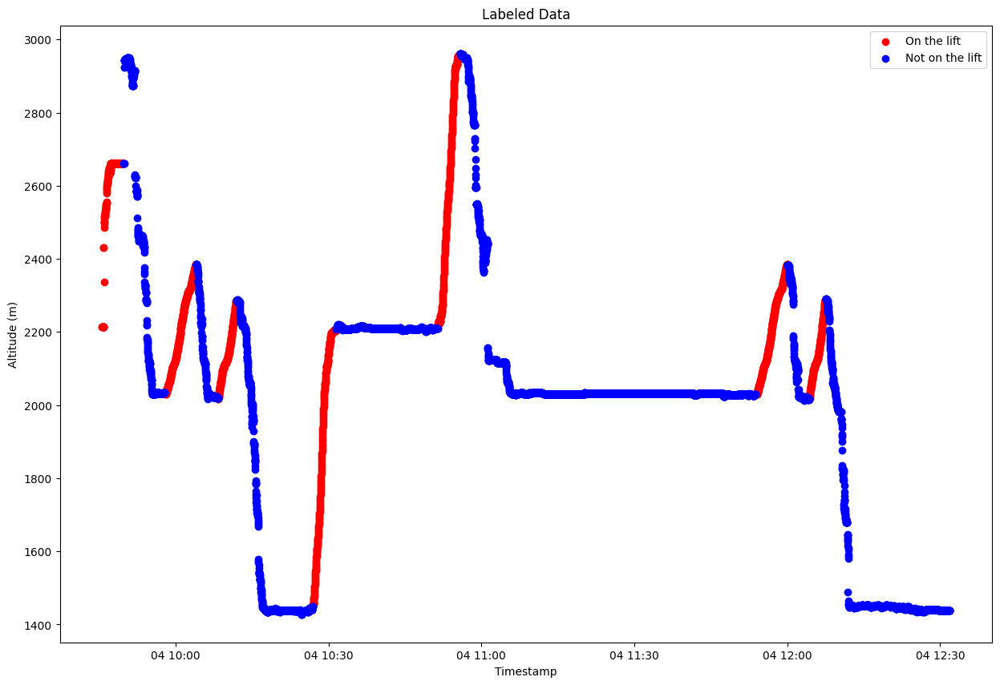

In [142]:
plot_manual_labeling(df_166_reduce_sampling_rate)

In [143]:
# # Call the function with your DataFrame
mymap = map_lift_rides(df_166_reduce_sampling_rate)
mymap

# Export

In [144]:
# export to CSV
name_of_csv='df_166_relebeled.csv'
df_166_reduce_sampling_rate.to_csv(name_of_csv, index=False)